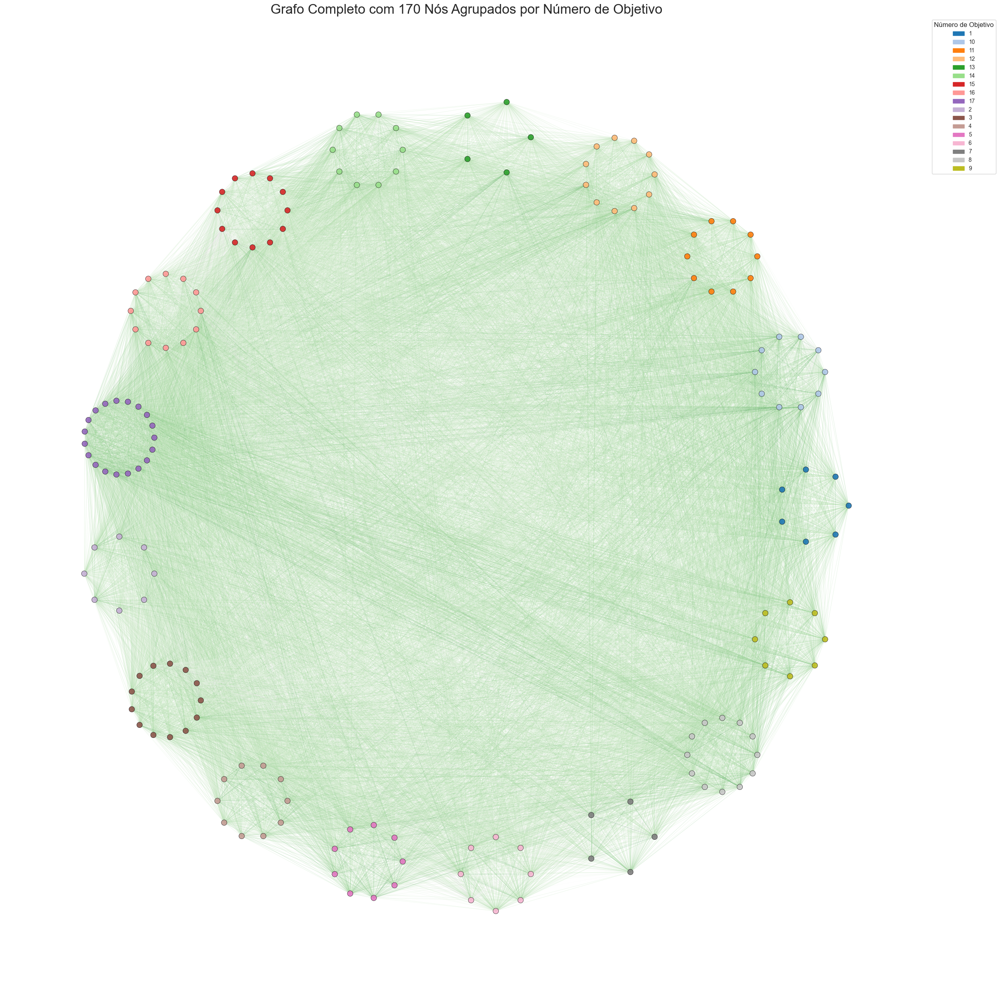

In [36]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
import numpy as np
import math

# Configuração do estilo do Seaborn para melhores gráficos
sns.set(style="whitegrid")

# ==========================================
# Passo 1: Carregar a matriz de similaridade do arquivo CSV
# ==========================================
df = pd.read_csv('data/nuevo_dataframe.csv', index_col=0)

# ==========================================
# Passo 2: Ordenar lexicograficamente as linhas e colunas
# ==========================================
nodos_ordenados = sorted(df.index)
df_sorted = df.loc[nodos_ordenados, nodos_ordenados]

# ==========================================
# Passo 3: Remover loops (arestas que conectam um nó a ele mesmo)
# ==========================================
df_no_loops = df_sorted.copy()
np.fill_diagonal(df_no_loops.values, np.nan)
G = nx.from_pandas_adjacency(df_no_loops)
G.remove_edges_from(nx.selfloop_edges(G))

# ==========================================
# Passo 4: Extrair o "número de objetivo" dos rótulos dos nós
# ==========================================
def extrair_numero_objetivo(label):
    return label.split('.')[0]

numeros_objetivo = [extrair_numero_objetivo(nodo) for nodo in G.nodes()]
numeros_unicos = sorted(list(set(numeros_objetivo)))

# ==========================================
# Passo 5: Mapear cada número de objetivo para uma cor distinta
# ==========================================
cmap_nodes = plt.get_cmap('tab20')  # 'tab20' possui 20 cores distintas

num_categorias = len(numeros_unicos)
if num_categorias <= cmap_nodes.N:
    cores_nodes = [cmap_nodes(i) for i in range(num_categorias)]
else:
    # Se houver mais categorias, usar um colormap contínuo
    cmap_extended = plt.get_cmap('hsv')
    cores_nodes = [cmap_extended(i / num_categorias) for i in range(num_categorias)]

color_map_nodes = {numero: cores_nodes[i] for i, numero in enumerate(numeros_unicos)}
node_colors = [color_map_nodes[numero] for numero in numeros_objetivo]

# ==========================================
# Passo 6: Gerar uma disposição personalizada agrupando por número de objetivo
# ==========================================
def gerar_disposicao_por_grupos(G, grupos, raio_grupo=50, raio_nodo=5):
    """
    Gera uma disposição onde cada grupo está disposto ao redor de um centro de grupo.
    :param G: Grafo do NetworkX.
    :param grupos: Lista de grupos, cada grupo é uma lista de nós.
    :param raio_grupo: Distância entre os centros dos grupos.
    :param raio_nodo: Distância entre os nós dentro de um grupo.
    :return: Dicionário de posições.
    """
    pos = {}
    num_grupos = len(grupos)
    angulo_entre_grupos = 2 * math.pi / num_grupos
    for i, grupo in enumerate(grupos):
        # Calcular o ângulo para o centro do grupo
        angulo = i * angulo_entre_grupos
        centro_x = raio_grupo * math.cos(angulo)
        centro_y = raio_grupo * math.sin(angulo)
        
        num_nodos = len(grupo)
        if num_nodos == 0:
            continue
        angulo_entre_nodos = 2 * math.pi / num_nodos
        for j, nodo in enumerate(grupo):
            # Calcular a posição relativa dentro do grupo
            angulo_nodo = j * angulo_entre_nodos
            x = centro_x + raio_nodo * math.cos(angulo_nodo)
            y = centro_y + raio_nodo * math.sin(angulo_nodo)
            pos[nodo] = (x, y)
    return pos

# Agrupar os nós por número de objetivo
grupos = {}
for nodo, numero in zip(G.nodes(), numeros_objetivo):
    if numero not in grupos:
        grupos[numero] = []
    grupos[numero].append(nodo)

grupos_lista = [grupos[numero] for numero in numeros_unicos]

# Gerar posições
pos_custom = gerar_disposicao_por_grupos(G, grupos_lista, raio_grupo=50, raio_nodo=5)

# ==========================================
# Passo 7: Preparar os pesos das arestas para visualização
# ==========================================
weights = nx.get_edge_attributes(G, 'weight')
all_weights = list(weights.values())

# Normalizar os pesos para o mapeamento de cores
norm = mcolors.Normalize(vmin=-1, vmax=1)

# ==========================================
# Passo 8: Definir uma função para plotar o grafo
# ==========================================
def plotar_grafo(G, pos, node_colors, titulo, color_map_nodes, numeros_unicos):
    plt.figure(figsize=(25, 25))
    
    # 8.1: Desenhar as arestas primeiro
    edges = G.edges(data=True)
    edge_weights = [d['weight'] for (u, v, d) in edges]
    # Alterar o colormap das arestas para 'PRGn' (Púrpura-Verde) para evitar o vermelho
    edge_cmap = plt.cm.PRGn  # Pode trocar para outro colormap se preferir
    
    nx.draw_networkx_edges(
        G, pos,
        edge_color=edge_weights,
        edge_cmap=edge_cmap,
        edge_vmin=-1,   # Definir o mínimo para normalização
        edge_vmax=1,    # Definir o máximo para normalização
        width=0.5,
        alpha=0.3  # Reduzir a opacidade para que as arestas não sobreponham os nós
    )
    
    # 8.2: Desenhar os nós sobre as arestas
    nx.draw_networkx_nodes(
        G, pos,
        node_size=100,  # Aumentar o tamanho dos nós
        node_color=node_colors,
        edgecolors='black',  # Adicionar bordas pretas aos nós
        linewidths=0.5,
        alpha=0.9  # Aumentar a opacidade dos nós
    )
    
    # Opcional: Desenhar etiquetas dos nós (pode ser muito denso)
    # nx.draw_networkx_labels(G, pos, font_size=6, font_color='black')
    
    # 8.3: Adicionar título em Português
    plt.title(titulo, fontsize=24)
    
    # Remover os eixos
    plt.axis('off')
    
    # ==========================================
    # Passo 9: Adicionar uma legenda para os números de objetivo
    # ==========================================
    # Criar patches para a legenda
    patches = [mpatches.Patch(color=color_map_nodes[numero], label=numero) for numero in numeros_unicos]
    
    plt.legend(
        handles=patches,
        title="Número de Objetivo",
        loc='upper left',
        bbox_to_anchor=(1, 1),
        fontsize=10,
        title_fontsize=12
    )
    
    # Mostrar o gráfico
    plt.tight_layout()
    plt.show()

# ==========================================
# Passo 10: Plotar a visualização geral
# ==========================================
plotar_grafo(
    G,
    pos_custom,
    node_colors,
    "Grafo Completo com 170 Nós Agrupados por Número de Objetivo",
    color_map_nodes,
    numeros_unicos
)

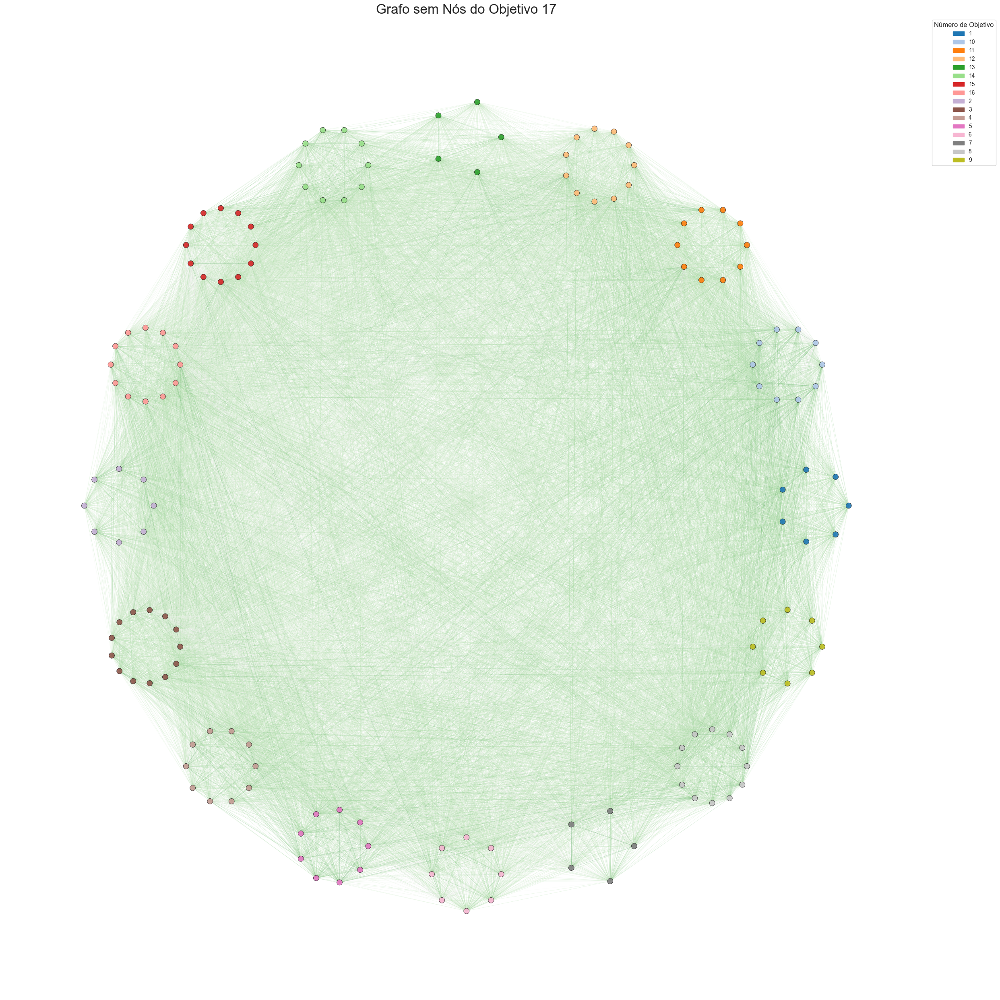

In [37]:

# ==========================================
# Passo 11: Criar uma visualização eliminando os nós do objetivo 17
# ==========================================
# Identificar os nós que pertencem ao objetivo 17
objetivo_a_eliminar = '17'
nodos_a_eliminar = [nodo for nodo, numero in zip(G.nodes(), numeros_objetivo) if numero == objetivo_a_eliminar]

# Criar um novo grafo sem os nós do objetivo 17
G_filtrado = G.copy()
G_filtrado.remove_nodes_from(nodos_a_eliminar)

# Atualizar as listas de objetivos e cores para o grafo filtrado
numeros_objetivo_filtrado = [extrair_numero_objetivo(nodo) for nodo in G_filtrado.nodes()]
numeros_unicos_filtrado = sorted(list(set(numeros_objetivo_filtrado)))

# Mapear cores novamente caso haja mudanças
color_map_nodes_filtrado = {numero: color_map_nodes[numero] for numero in numeros_unicos_filtrado}
node_colors_filtrado = [color_map_nodes_filtrado[numero] for numero in numeros_objetivo_filtrado]

# Agrupar os nós por número de objetivo no grafo filtrado
grupos_filtrado = {}
for nodo, numero in zip(G_filtrado.nodes(), numeros_objetivo_filtrado):
    if numero not in grupos_filtrado:
        grupos_filtrado[numero] = []
    grupos_filtrado[numero].append(nodo)

grupos_lista_filtrado = [grupos_filtrado[numero] for numero in numeros_unicos_filtrado]

# Gerar posições personalizadas para o grafo filtrado
pos_custom_filtrado = gerar_disposicao_por_grupos(G_filtrado, grupos_lista_filtrado, raio_grupo=50, raio_nodo=5)

# Plotar a visualização filtrada
titulo_filtrado = f"Grafo sem Nós do Objetivo {objetivo_a_eliminar}"
plotar_grafo(
    G_filtrado,
    pos_custom_filtrado,
    node_colors_filtrado,
    titulo_filtrado,
    color_map_nodes_filtrado,
    numeros_unicos_filtrado
)

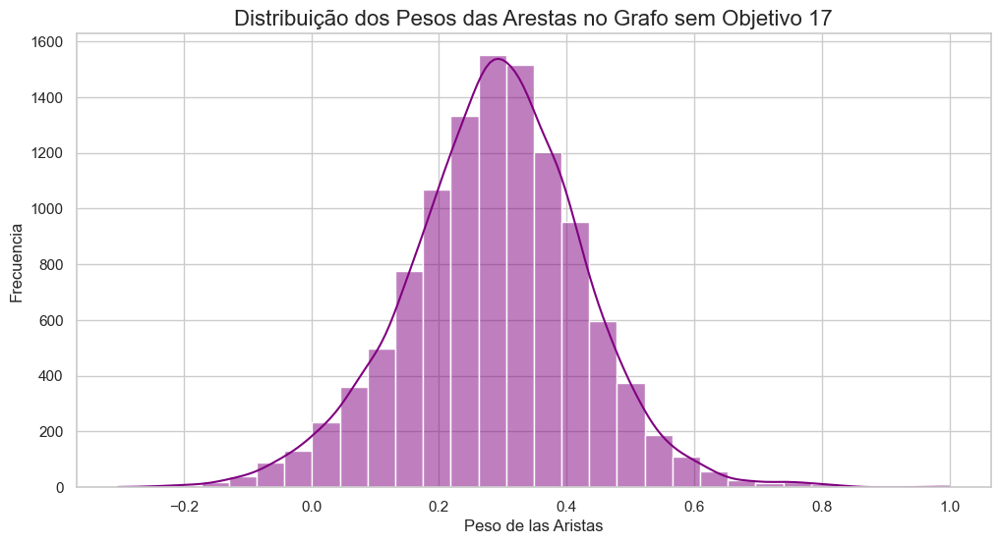

In [ ]:
# ==========================================
# Passo 12: Cálculo e Visualização de Métricas para o Grafo Filtrado
# ==========================================

# 12.1: Distribuição dos Pesos das Arestas
def plotar_distribuicao_pesos(G, titulo):
    pesos = list(nx.get_edge_attributes(G, 'weight').values())
    
    plt.figure(figsize=(12, 6))
    sns.histplot(pesos, bins=30, kde=True, color='purple')
    plt.title(titulo, fontsize=16)
    plt.xlabel("Peso das Arestas")
    plt.ylabel("Frequência")
    plt.show()

plotar_distribuicao_pesos(
    G_filtrado,
    "Distribuição dos Pesos das Arestas no Grafo sem Objetivo 17"
)

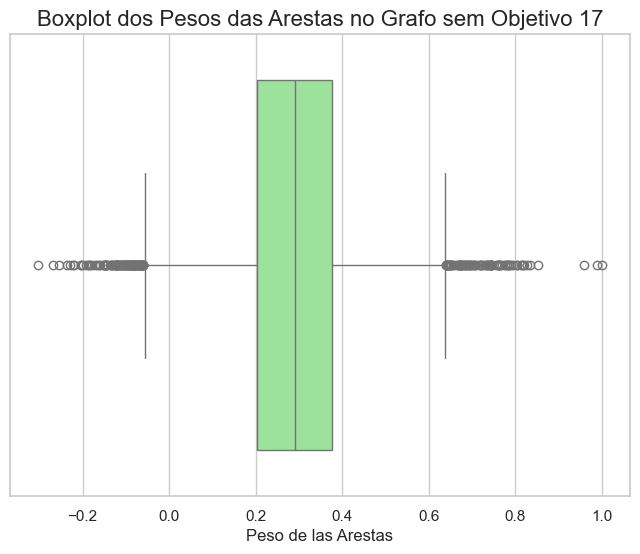

In [38]:
# 12.2: Boxplot de los pesos de las aristas
def plotar_boxplot_pesos(G, titulo):
    pesos = list(nx.get_edge_attributes(G, 'weight').values())
    
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=pesos, color='lightgreen')
    plt.title(titulo, fontsize=16)
    plt.xlabel("Peso de las Arestas")
    plt.show()

plotar_boxplot_pesos(
    G_filtrado,
    "Boxplot dos Pesos das Arestas no Grafo sem Objetivo 17"
)

In [39]:
# 12.3: Média e Total dos Pesos das Arestas
def calcular_metricas_pesos(G):
    pesos = list(nx.get_edge_attributes(G, 'weight').values())
    media = np.mean(pesos)
    total = np.sum(pesos)
    return media, total

media_pesos, total_pesos = calcular_metricas_pesos(G_filtrado)
print(f"Peso Médio das Arestas: {media_pesos:.4f}")
print(f"Peso Total das Arestas: {total_pesos:.4f}")

Peso Médio das Arestas: 0.2871
Peso Total das Arestas: 3208.5472


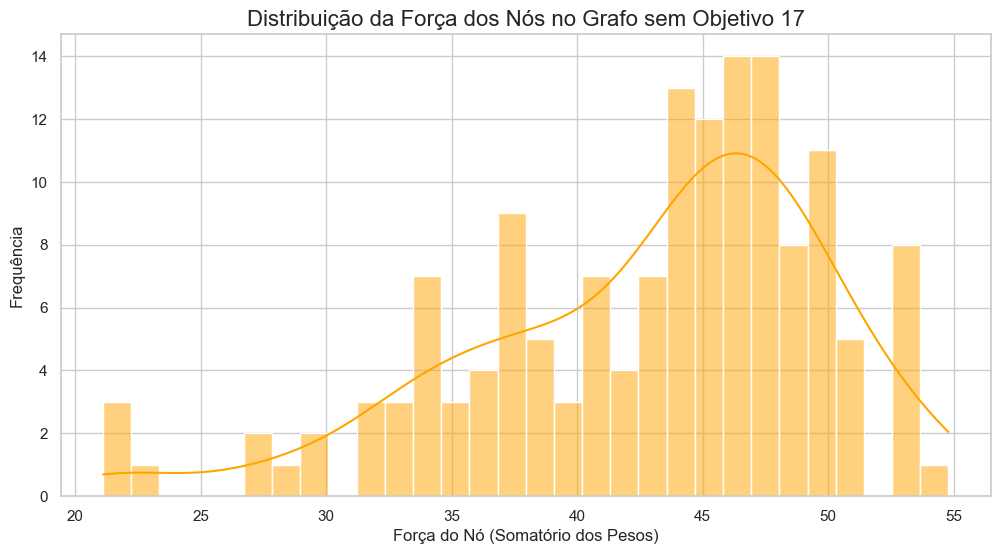

In [40]:

# 12.4: Distribuição da Força dos Nós (Somatório dos Pesos das Arestas de Cada Nó)
def plotar_distribuicao_forca_nodos(G, titulo):
    forca_nodos = dict(G.degree(weight='weight'))
    forca = list(forca_nodos.values())
    
    plt.figure(figsize=(12, 6))
    sns.histplot(forca, bins=30, kde=True, color='orange')
    plt.title(titulo, fontsize=16)
    plt.xlabel("Força do Nó (Somatório dos Pesos)")
    plt.ylabel("Frequência")
    plt.show()

plotar_distribuicao_forca_nodos(
    G_filtrado,
    "Distribuição da Força dos Nós no Grafo sem Objetivo 17"
)

In [41]:
# 12.5: Centralidade de Betweenness (Intermediária) Ponderada
def calcular_centralidade_betweenness(G):
    centralidade = nx.betweenness_centrality(G, weight='weight')
    return centralidade

centralidade_betweenness = calcular_centralidade_betweenness(G_filtrado)

# Top 5 nós por centralidade de intermediária
def mostrar_top_centralidade(centralidade, titulo, top_n=5):
    top = sorted(centralidade.items(), key=lambda x: x[1], reverse=True)[:top_n]
    print(titulo)
    for nodo, valor in top:
        print(f"Nó: {nodo}, Centralidade de Intermediária: {valor:.4f}")

mostrar_top_centralidade(
    centralidade_betweenness,
    "\nTop 5 Nós por Centralidade de Intermediária no Grafo sem Objetivo 17"
)


Top 5 Nós por Centralidade de Intermediária no Grafo sem Objetivo 17
Nó: 11.7, Centralidade de Intermediária: 0.9684
Nó: 7.3, Centralidade de Intermediária: 0.9669
Nó: 7.2, Centralidade de Intermediária: 0.9562
Nó: 16.1, Centralidade de Intermediária: 0.9557
Nó: 10.2, Centralidade de Intermediária: 0.9422


In [42]:
# 12.6: Centralidade Média para o Grafo Filtrado
def calcular_centralidade_media(centralidade):
    media = np.mean(list(centralidade.values()))
    return media

centralidade_media = calcular_centralidade_media(centralidade_betweenness)
print(f"\nCentralidade Média de Intermediáriação: {centralidade_media:.4f}")

# =====


Centralidade Média de Intermediáriação: 0.1676


Threshold: 0.7 - Grau Médio: 0.68
Threshold: 0.5 - Grau Médio: 8.15
Threshold: 0.3 - Grau Médio: 70.23


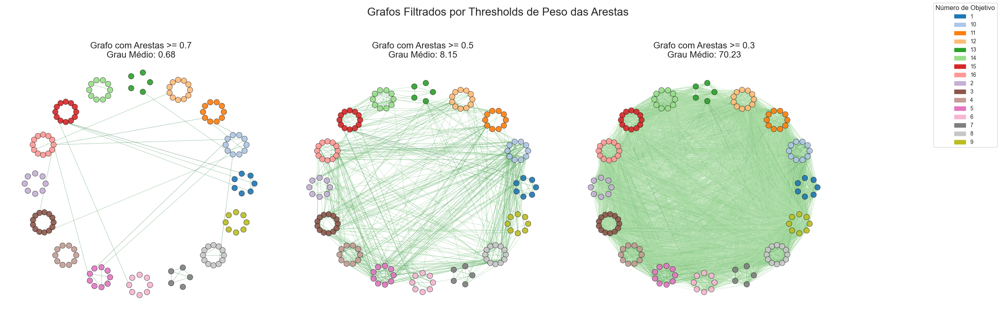

In [45]:

# ==========================================
# Passo 13: Plotar Grafos Filtrados por Thresholds em Subplots
# ==========================================
def plotar_grafos_thresholds(G, pos, node_colors, thresholds, titulo_base, color_map_nodes, numeros_unicos):
    fig, axes = plt.subplots(1, len(thresholds), figsize=(25, 8))
    
    for ax, threshold in zip(axes, thresholds):
        # Filtrar as arestas com peso >= threshold, mantendo os dados
        arestas_filtradas = [(u, v, d) for u, v, d in G.edges(data=True) if d['weight'] >= threshold]
        
        # Criar um subgrafo com as arestas filtradas
        G_threshold = nx.Graph()
        G_threshold.add_nodes_from(G.nodes(data=True))
        G_threshold.add_edges_from(arestas_filtradas)
        
        # Desenhar o subgrafo
        edge_weights = [d['weight'] for (u, v, d) in G_threshold.edges(data=True)]
        edge_cmap = plt.cm.PRGn
        
        nx.draw_networkx_edges(
            G_threshold, pos,
            edge_color=edge_weights,
            edge_cmap=edge_cmap,
            edge_vmin=-1,
            edge_vmax=1,
            width=0.5,
            alpha=0.6,
            ax=ax
        )
        
        nx.draw_networkx_nodes(
            G_threshold, pos,
            node_size=100,
            node_color=node_colors,
            edgecolors='black',
            linewidths=0.5,
            alpha=0.9,
            ax=ax
        )
        
        # Calcular o grau médio para o threshold atual
        numero_de_arestas = G_threshold.number_of_edges()
        numero_de_nodos = G_threshold.number_of_nodes()
        if numero_de_nodos > 0:
            grau_medio = (2 * numero_de_arestas) / numero_de_nodos
        else:
            grau_medio = 0
        print(f"Threshold: {threshold} - Grau Médio: {grau_medio:.2f}")
        
        # Adicionar título para cada subplot
        ax.set_title(f"Grafo com Arestas >= {threshold}\nGrau Médio: {grau_medio:.2f}", fontsize=16)
        ax.axis('off')
    
    # Adicionar título geral
    plt.suptitle(titulo_base, fontsize=20)
    
    # Criar legenda
    patches = [mpatches.Patch(color=color_map_nodes[numero], label=numero) for numero in numeros_unicos]
    fig.legend(
        handles=patches,
        title="Número de Objetivo",
        loc='upper right',
        fontsize=10,
        title_fontsize=12
    )
    
    plt.tight_layout(rect=[0, 0, 0.85, 0.95])
    plt.show()

# Definir os thresholds
thresholds = [0.7, 0.5, 0.3]

# Plotar os grafos filtrados por thresholds
plotar_grafos_thresholds(
    G_filtrado,
    pos_custom_filtrado,
    node_colors_filtrado,
    thresholds,
    "Grafos Filtrados por Thresholds de Peso das Arestas",
    color_map_nodes_filtrado,
    numeros_unicos_filtrado
)